In [1]:
%matplotlib inline
from k2utils import *
from vj_processing import *
from matplotlib.pyplot import subplots, subplots_adjust, savefig
pixmapfile = '../data/PixelMaps/Storage/PixelMaps/K2_target_pixels.hdf5'
objects = searchProposal('GO', 8)

In [2]:

def generate_lightcurve(pixels, aperture, mednorm=False, bkg_correct=True):
    
    lc_ = np.empty(len(pixels))
    if bkg_correct:
        lc_[::] = np.nansum(pixels[:,aperture] - np.nanmedian(pixels[:,~aperture], axis=1).reshape(-1,1), axis=1)
    else:
        lc_[::] = np.nansum(pixels[:,aperture], axis=1)
    #lc[::] = np.nansum(pixels[:,aperture], axis=1) - np.nanmedian(pixels[:,~aperture], axis=1)
    if mednorm:
        lc_[::] /= np.nanmedian(pixels[:, aperture], axis=1)
    return lc_

def get_aperture(hdu, thresh):
    if thresh == 'max':
        thresh = np.max(hdu['APERTURE'].data)-1
    
    return np.array(hdu['APERTURE'].data > thresh, dtype=np.bool)


def correction_helper(hdu, lc, aperture):
    smooth=0
    corrected_target_pixels, corrections, nearest_pix = correct_target_pixels(hdu, lc, None, max_pix=250, min_pix=None, smooth=smooth)
    c= corrections[:, aperture]
    p= np.array(hdu[1].data['FLUX'])[:, aperture]
    n = nearest_pix[:, aperture]
    print 'pix, near, cor'
    for idx in [0, 48*5, -48*5]:
        print idx
        for line in zip(p[idx], n[idx], c[idx]):
            print line
    #aperture = get_aperture(hdu, max)
    corrected_lc =  generate_lightcurve(corrected_target_pixels, aperture, mednorm=False, bkg_correct=False)
    correction_lc = generate_lightcurve(corrections, aperture, mednorm=False, bkg_correct=False)
    
    return corrected_lc, correction_lc
    

def correct_target_pixels(hdu, lc, aperture, max_pix=None, min_pix=None, smooth=0):
    '''
    TODO: Try making the corrections for each pixel in terms of it's mean deviation in it's bin
    i.e. do a scaled correction rather than an additive one, this takes care of binning issue
    correct the target pixels of an object based on the percentiles input
    Could also try using multiple position bins (weightest based on distance) to 
    better estimate pixels near bin boundaries
        more percentiles means better resolution but more noise
        
        We'll do 3 corrections.  First on the raw target pixels, then on
        the VJ and EVEREST light curves
        
        aperture is a mask'''
    
    #percentiles = np.arange(0,100.1,0.1)
    #lc = get_pixel_lc(gen, percentiles)
    # First we'll do the hard part, target pixel correction
    target_pixels = BasicFitsContainer('PIX',hdu,'FLUX')

    del hdu
    if max_pix is None:
        max_pix = np.inf
    if min_pix is None:
        min_pix = -np.inf
    print "Max Pixel Flux For Correction set to {}".format(max_pix)
    print "Min Pixel Flux For Correction set to {}".format(min_pix)
    corrections = np.empty(target_pixels.pixels.shape)
    corrections[::] = 0.0
    corrected_target_pixels = np.empty(target_pixels.pixels.shape)
    corrected_target_pixels[::] = target_pixels.pixels[::]
    N = len(target_pixels.pixels)
    bins = np.concatenate((lc[:,:,0], lc[:,-1:,1]), axis=1)
    #corrected_target_pixels[corrected_target_pixels > max_pix] = max_pix
    corrected_target_pixels[corrected_target_pixels > max_pix] = np.nan
    corrected_target_pixels[corrected_target_pixels < min_pix] = np.nan
    #means = np.nanmean(lc[:, :, 4], axis=0)
    stds = np.nanstd(lc[:, :, 3], axis=0)
    # try out something new here
    #means = np.nanmedian(target_pixels.pixels, axis=0)
    lc_means = np.empty(lc[:, :, 3].shape)
    lc_means[::] = lc[:,:,3]

    nearest_pix = np.empty(corrected_target_pixels.shape)
    nearest_pix[::] = np.nan

    #nearest_pix[:,~aperture] = np.nanmedian(target_pixels.pixels[:,~aperture], axis=1)
    if smooth:
        if smooth is True:
            smooth = 60
        lc_means[:] = np.array(runningMean(lc_means.T,smooth,axis=0)).T
    means = np.nanmean(lc_means, axis=0)
    
    with LoadingBar(True) as lb:
        lb.mapping = '-<{<'
        for i in xrange(N):
            '''for each cadence'''
            mask = (~np.isnan(corrected_target_pixels[i]) & \
                (corrected_target_pixels[i] >= np.min(bins[i])) & \
                (corrected_target_pixels[i] < np.max(bins[i]))
                   )
            positions = np.digitize(corrected_target_pixels[i,mask], bins[i]) - 1
            nearest = lc_means[i, positions]
            mean = means[positions]
            #std = stds[positions]

            nearest_pix[i, mask] = nearest
            #corrections[i, mask] = nearest - mean
            # try out something new here
            # Need to weight the two nearby intervals
            direction = np.sign(target_pixels.pixels[i, mask] - nearest).astype(np.int)
            positions2 = positions + direction
            positions2[positions2 < 0] = lc_means.shape[1]-1
            positions2[positions2 == lc_means.shape[1]] = 0 # Warning, this is temporary to have a minimal weighting
            nearest2 = lc_means[i, positions2]
            mean2 = means[positions2]
            
            #corrections[i, mask] = ((nearest - mean)*(nearest2 - target_pixels.pixels[i, mask])-(nearest2 - mean2)*(nearest - target_pixels.pixels[i, mask]))/(nearest2-nearest)
            n = nearest
            n2 = nearest2

            #This is something different
            #n = target_pixels.pixels[i,mask]
            #n2 = n
            #
            dn = np.abs(nearest - nearest2)
            d1 = n - mean
            d2 = n2 - mean2
            w1 = 1.0 - np.abs(target_pixels.pixels[i, mask] - nearest)/(dn)
            w2 = 1.0 - np.abs(target_pixels.pixels[i, mask] - nearest2)/(dn)
            
            
            # Let's try subtracting off the higher one, I shouldn't do this though, since there's no reason to
            high = np.maximum(d1, d2)
            low = np.minimum(d1, d2)
            # for high and low, shouldn't we be looking for the direction, not the deviation?
            #high = np.maximum(mean, mean2)
            #low = np.minimum(mean, mean2)
            #d1[d1 == low] *= -1
            #d2[d2 == low] *= -1
            #d1[mean == high] *= 1.0
            #d2[mean2 == high] *= 1.0
            ###
            corrections[i, mask] = (d2*w2 + d1*w1)
            # pray that I got my math right
            
            # end
            #corrections[i, mask] = nearest - mean
            corrected_target_pixels[i, mask] = target_pixels.pixels[i, mask] - corrections[i, mask]
            #corrected_target_pixels[i, ~mask] = target_pixels.pixels[i, ~mask] - corrections[i, ~mask]
          
            lb.update_bar(1.0*i/N)
    corrected_target_pixels[np.isnan(corrected_target_pixels)] = target_pixels.pixels[np.isnan(corrected_target_pixels)]
    return corrected_target_pixels, corrections, nearest_pix

def make_pixel_lc(lc, percentiles, stat='median', diff=False, med_norm=False):

    t = 0.02043229*np.arange(N)+2559.06849083
    bins = np.array(zip(percentiles[:-1], percentiles[1:]))
    bins = filter(lambda x: None not in x, bins) # for percentiles containing Nones
    idx = {'var':2, 'median':3, 'mean':4}[stat]
    stat = np.empty((2,)) # so we can keep track of the median magnitudes between percentiles
    y = np.empty((N,))
    
    for i,b in enumerate(bins):
        y[::] = lc[:,i,idx]
        stat[::] = [np.nanmedian(lc[:,i,0]),np.nanmedian(lc[:,i,1])]
        
        if diff and i:
            y[::] -= lc[:,i-1,idx]
            stat[::] = np.nanmean([stat,[np.nanmedian(lc[:,i-1,0]),np.nanmedian(lc[:,i-1,1])]], axis=0)

        if med_norm: # divide out by mean
            y[::] /= np.nanmedian(y)
        else:
            med = np.nanmedian(y)
            std = np.nanstd(y)
            y[::] = (y-med)/std
        
        label = '{:.2f}\% to {:.2f}\%, KepMag: {:.2f} to {:.2f}'.format(*(tuple(b)+tuple(fluxToMag(stat))))
        yield t,copy(y),label,copy(stat)
        
def get_vj_lcs(objs, ccd):
    
    urls = (get_vj_url(EPIC, campaign=ccd.campaign) for EPIC in objs)
    downloader = fits_downloader(urls)

    for i, hdu in enumerate(downloader):
        t = np.array(hdu['BESTAPER'].data['T'])
        lc = np.array(hdu['BESTAPER'].data['FCOR'])
        best_aper = 'CIRC_APER_TBL' if hdu['BESTAPER'].header['MASKTYPE'] == 'CIRCULAR' else 'PRF_APER_TBL'
        best_idx = hdu['BESTAPER'].header['MASKINDE']
        aper = np.array(hdu[best_aper].data[best_idx])
        yield t, lc, aper
        del hdu
    

def plot_pixel_image(args, title=None, ylim=None, STEP=120, smooth=False):
    smooth_p = False
    import matplotlib.pyplot as plt
    fig, ax = subplots(1,1, figsize=(16,9))
    args = list(args)
    
    image = np.array([y for t,y,_,b in args][::-1])
    
    #print image
    if smooth: # This is very very slow
        if smooth is True:
            smooth = 30
        #image[::] = np.array([runningMean(y,120) for y in image])
        image = np.array(runningMean(image.T,smooth,axis=0)).T
    if smooth_p: # This is very very slow
        if smooth_p is True:
            smooth_p = 30
        #image[::] = np.array([runningMean(y,120) for y in image])
        image = np.array(runningMean(image,smooth_p,axis=0))
    if STEP > 1:
        image = np.array([np.mean(image[:,i:i+STEP], axis=1) for i in xrange(0,image.shape[1],STEP)]).T
        
    #image -= np.nanmean(image, axis=0).reshape(1,-1)
    col, row = image.shape
    t = 0.02043229*np.arange(N)+2559.06849083

    #cmap = rplot.palettable.colorbrewer.diverging.BrBG_11.mpl_colormap
    cmap = rplot.palettable.cubehelix.perceptual_rainbow_16.mpl_colormap
    cmap = rplot.palettable.colorbrewer.diverging.PuOr_11.mpl_colormap
    if ylim is not None:
        im = ax.imshow(image, cmap=cmap, vmin=ylim[0], vmax=ylim[1], aspect='auto')
        cbar=fig.colorbar(im, ticks=np.linspace(ylim[0],ylim[1], 1+(ylim[1]-ylim[0])))
    else:
        im = ax.imshow(image, cmap=cmap, aspect='auto')
        cbar = fig.colorbar(im)
    if title is not None:
        ax.set_title(title)
    

        
    ax.set_yticks(np.linspace(0, ax.get_ybound()[1]+1, 20))
    
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, pos: int((col-1-y)*100/col+0.5)))
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: int(x*1.0/row*N*0.02043229+2559.06849083)))
    
    ax.set_xlabel('Date')
    ax.set_ylabel('Percentile')
    #print ax.get_ylim()
    
    if args[0][3] is not None:
        bins = np.array([bins for _,_,_,bins in args][::-1])
        #print bins.shape
        axis_labels = ["{:.2f}".format(i) for i in fluxToMag(np.mean(bins, axis=1))[::-1]]
        #print axis_labels
        #ax.tick_params(labelbottom='on',labeltop='off', labelleft="on", 
        #    top='off', left='on', right='off')
        #ax2 = fig.add_axes(ax.get_position(), frameon=False)
        ax2 = ax.twinx()
        ax2.set_yticks(np.linspace(0, ax2.get_ybound()[1]+1, 20))
        #print axis_labels
        ax2.set_yticklabels(axis_labels[int(i+0.5)] for i in np.linspace(0, len(axis_labels), 20, endpoint=False))
        #ax2.tick_params(labelbottom='off',labeltop='off', labelleft="off", labelright='on',
        #    bottom='off', left='off', right='on', which='both')
        
        #ax2.set_ylim(ax.get_ylim())
        #ax2.set_xlim(ax.get_xlim())
        #plt.draw()
        #ax2.set_position(ax.get_position())
        #plt.draw()
        #print axis_labels
        ax.autoscale(False)
        ax2.autoscale(False)
        def formatter(x, pos):
            #print x
            if pos is None:
                return ''
            idx = int(x*len(axis_labels)/(ax2.get_ybound()[1]+1)+0.5)
            if idx >= len(axis_labels) or idx < 0:
                return ''
            if np.isnan(axis_labels[idx]):
                return 'NaN'
            #print "{:.2f}".format(axis_labels[idx])
            return "{:.1f}".format(axis_labels[idx])
        #ax2.yaxis.set_major_formatter(ticker.FuncFormatter(formatter))
        #ax2.yaxis.set_label_position("right")
        #ax2.set_ylim(ax.get_ylim())
        #ax2.set_ylim(axis_labels[0], axis_labels[-1])
        #ax2.yaxis.set_view_interval(axis_labels[0], axis_labels[-1])
        #ax2.set_adjustable('box-forced')
        #plt.draw()
        
        #print "ax2:",ax2.get_ylim()
        #print "ax: ",ax.get_ylim()
        #ax2.set_ylabel('Kep Mag')
    
    return image

In [3]:

# The standard Star {
SS_EPIC = 220210778
channel = 0
campaign = 8
module = 22
field = "FLUX"
# }
SS_CCD =  CCD(channel=channel, campaign=campaign, module=module, field=field)

#EPIC = 220282234
QSO_EPIC = 220268684 # Faint object (~19th magnitude) AGN with massive trends
QSO_EPIC = 220284690 #ditto
#EPIC = 220289355 # ditto again
module = 6
channel = 2
campaign = 8
field='FLUX'

QSO_CCD = CCD(channel=channel, campaign=campaign, module=module, field=field)

# A Cepheid Variable{
#EPIC = 229228839
#EPIC = 229228820 # Lower Periodicity
#EPIC = 229228821 # Higher Periodicity
CV_EPIC = 229228827 # Mid Periodicity, showing some trends
#EPIC = 229228829 # more periodic, small possible trends
#EPIC = 229228854
#EPIC = 229228846
#EPIC = 229228822
#EPIC = 229228844


module = 17
channel = K2FOV.Field.get_channels(module).index(58)
field = 'FLUX'
CV_CCD = CCD(channel=channel, campaign=campaign, module=module, field=field)

SS = (SS_CCD, SS_EPIC)
CV = (CV_CCD, CV_EPIC)
QSO = (QSO_CCD, QSO_EPIC)

objs = (SS, CV, QSO)

conts = [PixelMapContainer.from_hdf5(pixmapfile, ccd) for ccd, _ in objs]
gens = [PixMapGenerator(cont, cache=True) for cont in conts]


In [4]:
percentiles = np.linspace(0,100,501)
#percentiles = 10**2-np.logspace(0,2.0, 501)[::-1]#+10**1.9
print percentiles
lcs = [get_pixel_lc(gen, percentiles, mag_range=(19.81, np.inf)) for gen in gens]

[   0.     0.2    0.4    0.6    0.8    1.     1.2    1.4    1.6    1.8
    2.     2.2    2.4    2.6    2.8    3.     3.2    3.4    3.6    3.8
    4.     4.2    4.4    4.6    4.8    5.     5.2    5.4    5.6    5.8
    6.     6.2    6.4    6.6    6.8    7.     7.2    7.4    7.6    7.8
    8.     8.2    8.4    8.6    8.8    9.     9.2    9.4    9.6    9.8
   10.    10.2   10.4   10.6   10.8   11.    11.2   11.4   11.6   11.8
   12.    12.2   12.4   12.6   12.8   13.    13.2   13.4   13.6   13.8
   14.    14.2   14.4   14.6   14.8   15.    15.2   15.4   15.6   15.8
   16.    16.2   16.4   16.6   16.8   17.    17.2   17.4   17.6   17.8
   18.    18.2   18.4   18.6   18.8   19.    19.2   19.4   19.6   19.8
   20.    20.2   20.4   20.6   20.8   21.    21.2   21.4   21.6   21.8
   22.    22.2   22.4   22.6   22.8   23.    23.2   23.4   23.6   23.8
   24.    24.2   24.4   24.6   24.8   25.    25.2   25.4   25.6   25.8
   26.    26.2   26.4   26.6   26.8   27.    27.2   27.4   27.6   27.8
   28.

k2utils.py:202: RuntimeWarning: invalid value encountered in log10
  return np.log10(flux/1.74e5)/(-0.4)+12
/home/rodot/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:224: DeprecationWarning: object of type <type 'float'> cannot be safely interpreted as an integer.


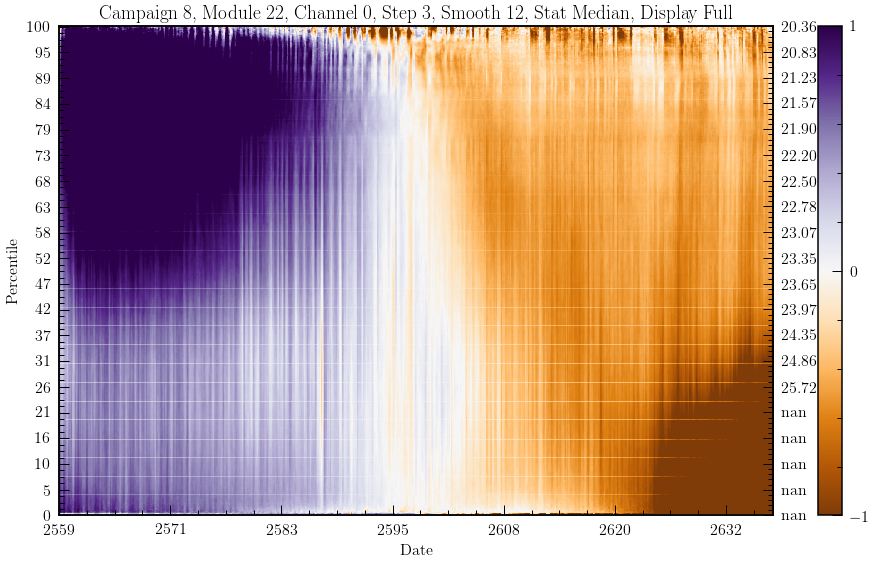

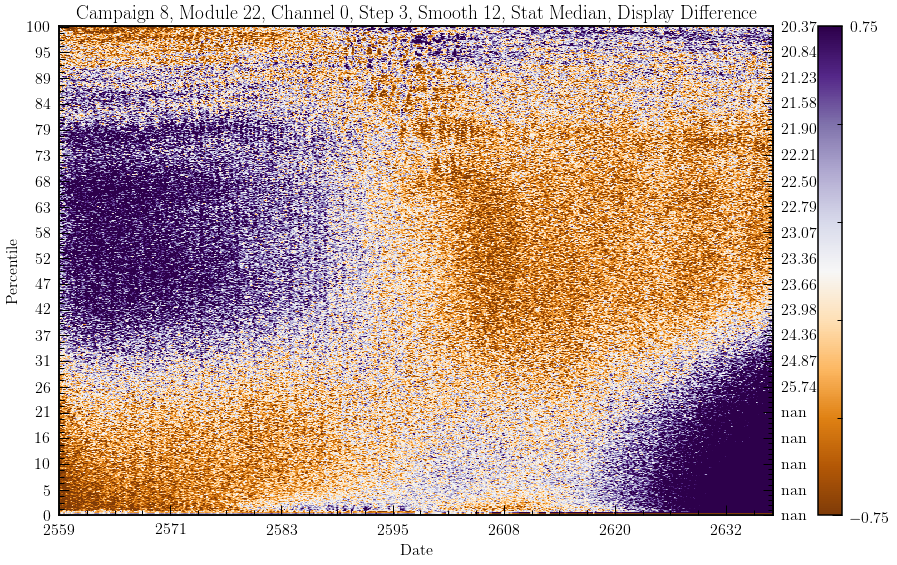

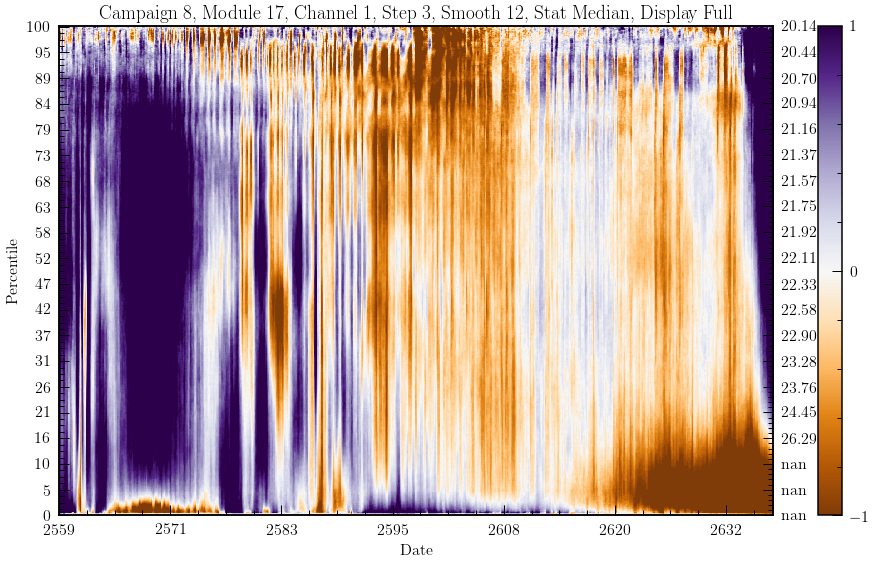

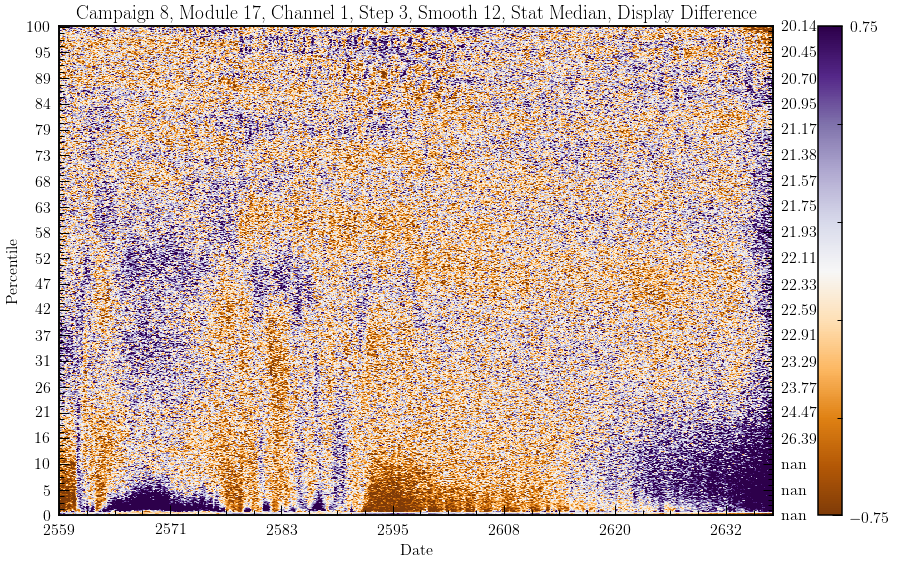

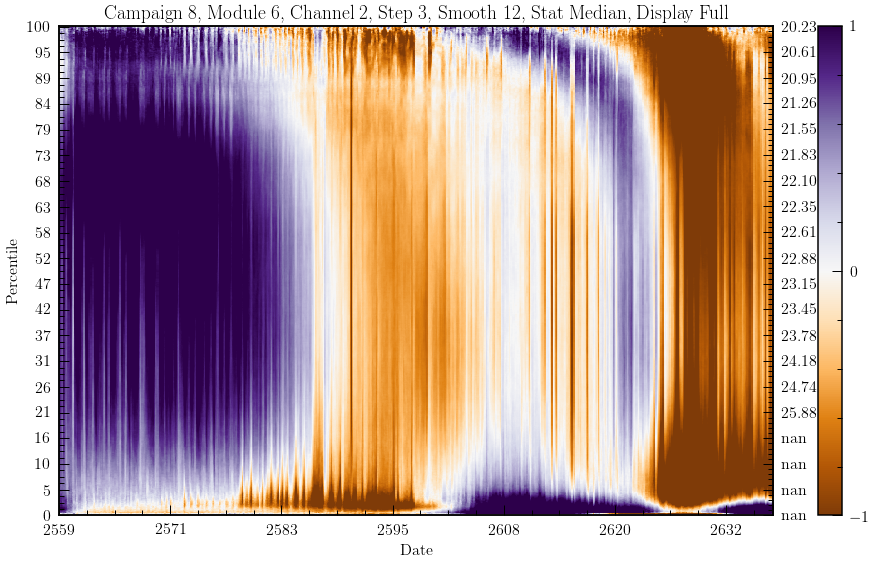

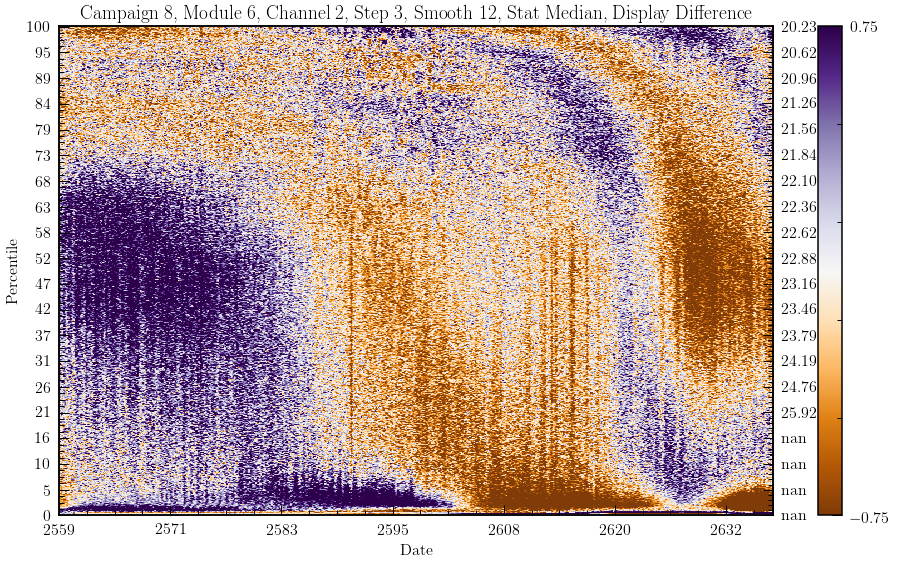

In [5]:
STEP=1
STEP = N/len(percentiles)*(9)/16
SMOOTH=12

for obj, lc in zip(objs,lcs):
    ccd, epic = obj
    title_args = (ccd.campaign, ccd.module, ccd.channel, STEP, SMOOTH)
    title = "Campaign {}, Module {}, Channel {}, Step {}, Smooth {}, Stat {{}}, Display {{}}".format(*title_args)

    
    args = make_pixel_lc(lc, percentiles, diff=False)

    plot_pixel_image(args, ylim=(-1.0, 1.0), STEP=STEP, smooth=SMOOTH, title=title.format('Median', 'Full'));

    args = make_pixel_lc(lc, percentiles, diff=True)

    plot_pixel_image(args, ylim=(-0.75, 0.75), STEP=STEP, smooth=SMOOTH, title=title.format('Median', 'Difference'));


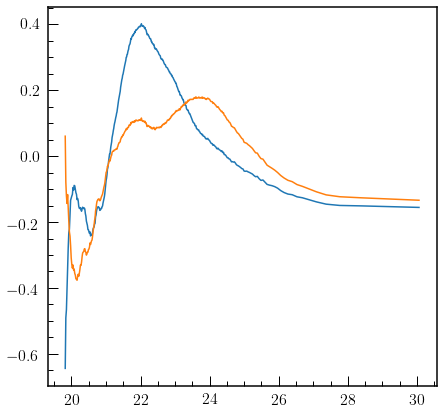

In [6]:
fig, ax = subplots(1,1)

args = list(make_pixel_lc(lc, percentiles, diff=False))

devs = np.array([y for _, y, _, _ in args])
bins = fluxToMag(np.array([np.nanmean(b) for _, _, _, b in args]))
x = np.linspace(1/500.0,1,500)

points = np.nanmean(devs[:,:48*20]-np.nanmean(devs[:,:48*20]), axis=1)
ax.plot(bins,points)

points = np.nanmean(devs[:,-48*20:]-np.nanmean(devs[:,-48*20:]), axis=1)
ax.plot(bins,points)
#ax.hist(bins[~np.isnan(bins)], bins=50)
#ax.plot(bins, x)
#ax.plot(bins, x)
#ax.set_xscale('log')

In [ ]:
from scipy.signal import detrend
#fig, ax = subplots(1,2, figsize=(16*2,9), dpi=200, sharex=True)
figs, ax = zip(*[subplots(1,1, figsize=(16,9), dpi=200) for _ in (1,1,1)])
#ax[0].set_title(title, fontsize=36)


fs = []
cs = []
for i, (obj, lc) in enumerate(zip(objs, lcs)):
    ccd, epic = obj
    fig = figs[i]
    ax[i].set_title('EPIC %i' % epic, fontsize=36)

    urls = [get_target_pixel_url(epic,8)]
    hdu = next(fits_downloader(urls))
    t = hdu['TARGETTABLES'].data['TIME']
    t_vj, f_vj, aperture = next(get_vj_lcs([epic], ccd))
    #aperture = get_aperture(hdu, 'max')
    #print aperture
    #aperture = get_aperture(hdu, 'max')
    f = generate_lightcurve(hdu['TARGETTABLES'].data['FLUX'], aperture.astype(np.bool), mednorm=False, bkg_correct=False)
    fs.append(f)
    plotNiceIntervals(ax[i], t, f, label='EPIC %i'% (epic), N=60, color='k')
    corrected_lc, correction_lc = correction_helper(hdu, lc, aperture.astype(np.bool))

    correction_lc = correction_lc
    corrected_lc = corrected_lc
    corrected_lc = f - detrend(correction_lc)
    cs.append(corrected_lc)
    plotNiceIntervals(ax[i], t, corrected_lc, label='Corrected', N=60)
    #plotNiceIntervals(ax[i], t, detrend(correction_lc)+np.nanmean(f), label='Correction', N=60)
    plotNiceIntervals(ax[i], t, correction_lc+np.nanmean(f), label='Correction', N=60)
    #plotNiceIntervals(ax[i], t_vj, f_vj*np.nanmedian(f), label='VJ SFF', N=60)
    m = np.nanmean(f)
    s = np.nanstd(f)
    ax[i].legend(fontsize=24, loc=2, numpoints=1)
    ax[i].lines[-2].set_visible(False)
    ax[i].lines[-4].set_visible(False)
    ax[i].lines[-6].set_visible(False)
    ax[i].set_ylim(m-1.5*s, m+1.5*s)
    ax[i].set_xlim(t[0], t[-1])
    ax[i].axhline(m, color='k')
    ax[i].set_ylabel('Flux $(e^{-}/s)$', fontsize=24)

    for tick in ax[i].xaxis.get_major_ticks():
        tick.label.set_fontsize(26) 

    for tick in ax[i].yaxis.get_major_ticks():
        tick.label.set_fontsize(26) 
    print '.',
    ax[i].set_xlabel('Time (days)', fontsize=36)
    fig.tight_layout()
    savefig('../plots/CorrectionExample%i.png' % epic)
    
'''
fs = np.nanmean(fs, axis=0)
cs = np.nanmean(cs, axis=0)
plotNiceIntervals(ax[-1], t, fs, N=60, label='Mean')
plotNiceIntervals(ax[-1], t, cs+np.nanmean(cs), N=60, label='Mean Corrected')
plotNiceIntervals(ax[-1], t, (fs-cs)+np.nanmean(fs), N=60, label='Mean Correction')
m = np.nanmean(fs)
s = np.nanstd(fs)
ax[-1].set_ylim(m-2*s, m+2*s)
ax[-1].set_xlim(t[0], t[-1])
ax[-1].legend(fontsize=24, loc=2)
ax[-1].axhline(m)
ax[-1].set_xlabel('Time (days)', fontsize=36)


ax[0].set_ylabel('Median Normalized Flux (arbitrary\ units)', fontsize=36)
'''
fig.tight_layout()
subplots_adjust(hspace=0.05)
#savefig('../plots/CorrectionExample.png')


Folding...
Folding Over Interval 1530
19.8165147399
19.5316563592
Folding Over Interval 1531
19.8165147399
19.5316563592
Folding Over Interval 1532
19.8165147399
19.5316563592
Folding Over Interval 1533
19.8165147399
19.5316563592
Folding Over Interval 1534
19.8165147399
19.5316563592
Folding Over Interval 1535
19.8165147399
19.5316563592
Folding Over Interval 1536
19.8165147399
19.5316563592
Folding Over Interval 1537
19.8165147399
19.5316563592
Folding Over Interval 1538
19.8165147399
19.5316563592
Folding Over Interval 1539
19.8165147399
19.5316563592
Folding Over Interval 1540


/home/rodot/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


19.8165147399
19.5316563592
Folding Over Interval 1541
19.8165147399
19.5316563592
Folding Over Interval 1542
19.8165147399
19.5316563592
Folding Over Interval 1543
19.8165147399
19.5316563592
Folding Over Interval 1544
19.8165147399
19.5316563592
Folding Over Interval 1545
19.8165147399
19.5316563592
Folding Over Interval 1546
19.8165147399
19.5316563592
Folding Over Interval 1547
19.8165147399
19.5316563592
Folding Over Interval 1548
19.8165147399
19.5316563592
Folding Over Interval 1549
19.8165147399
19.5316563592
Folding Over Interval 1550
19.8165147399
19.5316563592
Folding Over Interval 1551
19.8165147399
19.5316563592
Folding Over Interval 1552
19.8165147399
19.5316563592
Folding Over Interval 1553
19.8165147399
19.5316563592
Folding Over Interval 1554
19.8165147399
19.5316563592
Folding Over Interval 1555
19.8165147399
19.5316563592
Folding Over Interval 1556
19.8165147399
19.5316563592
Folding Over Interval 1557
19.8165147399
19.5316563592
Folding Over Interval 1558
19.8165147

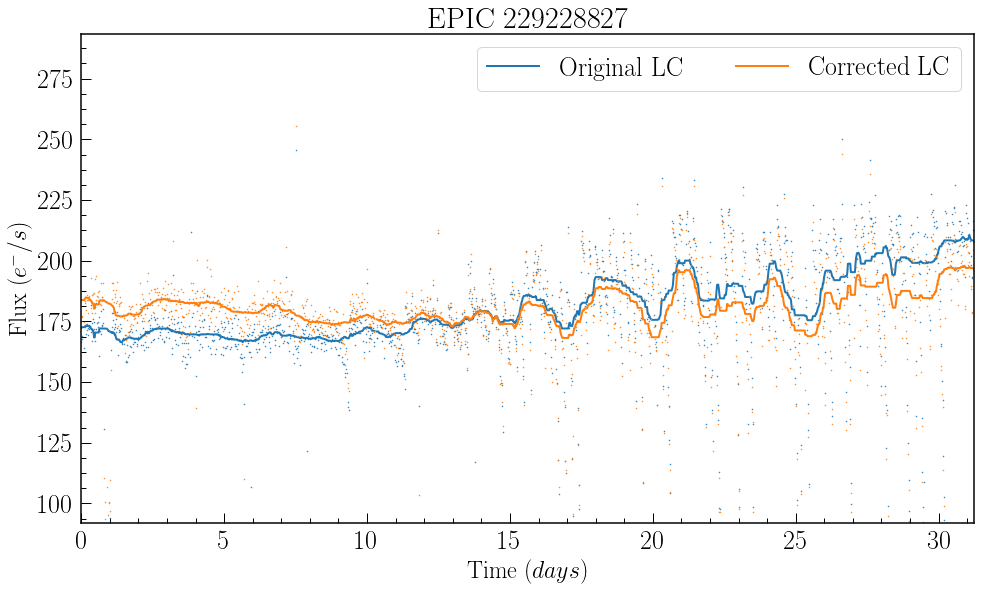

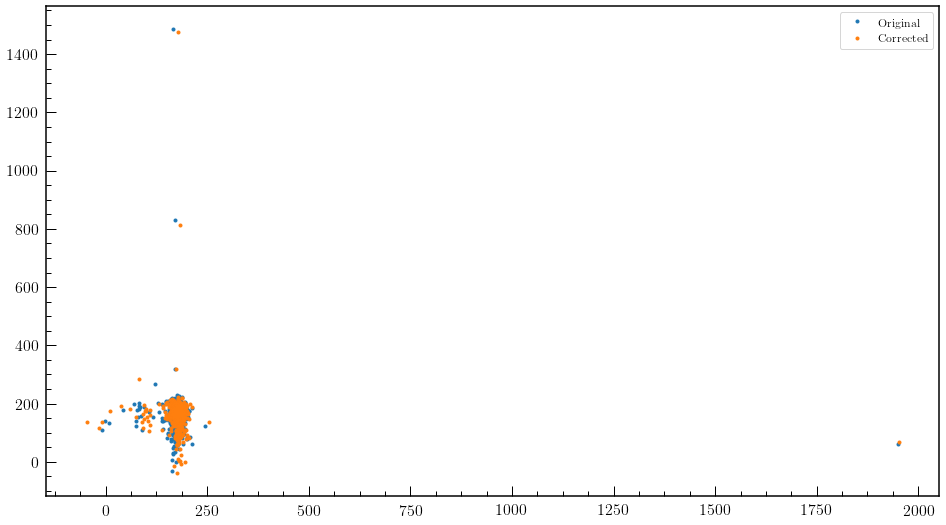

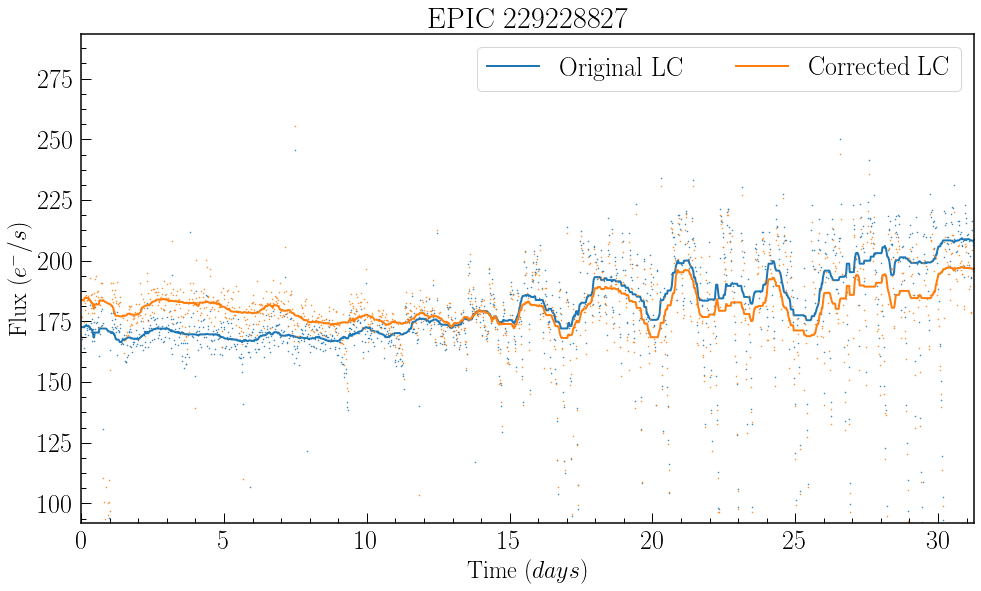

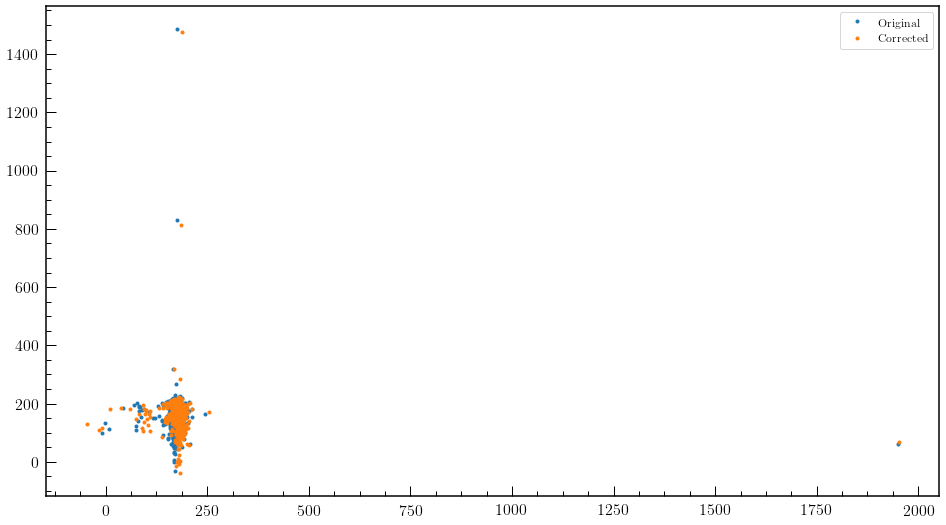

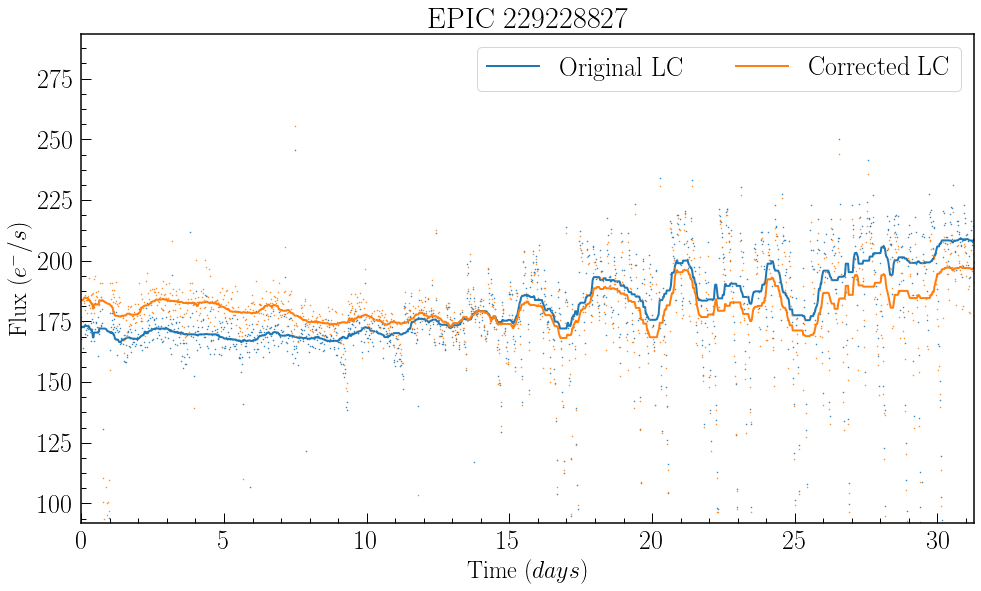

...

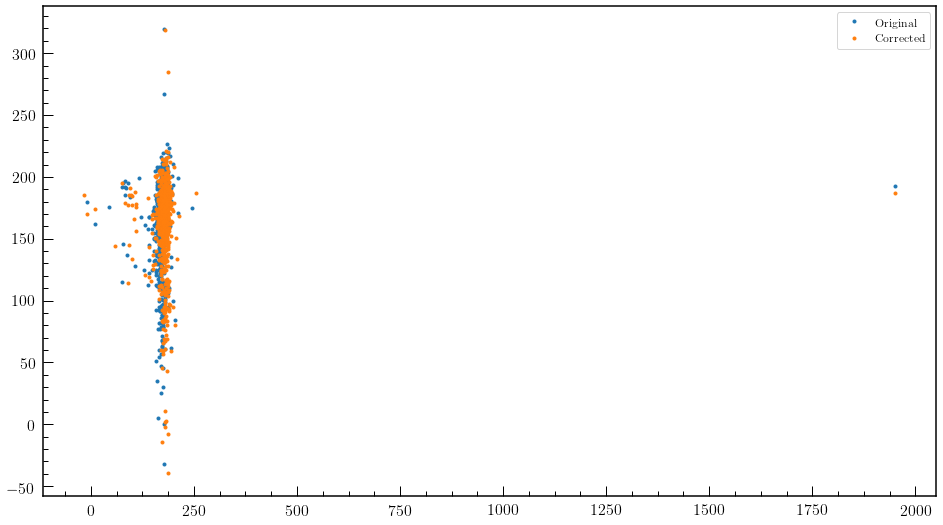

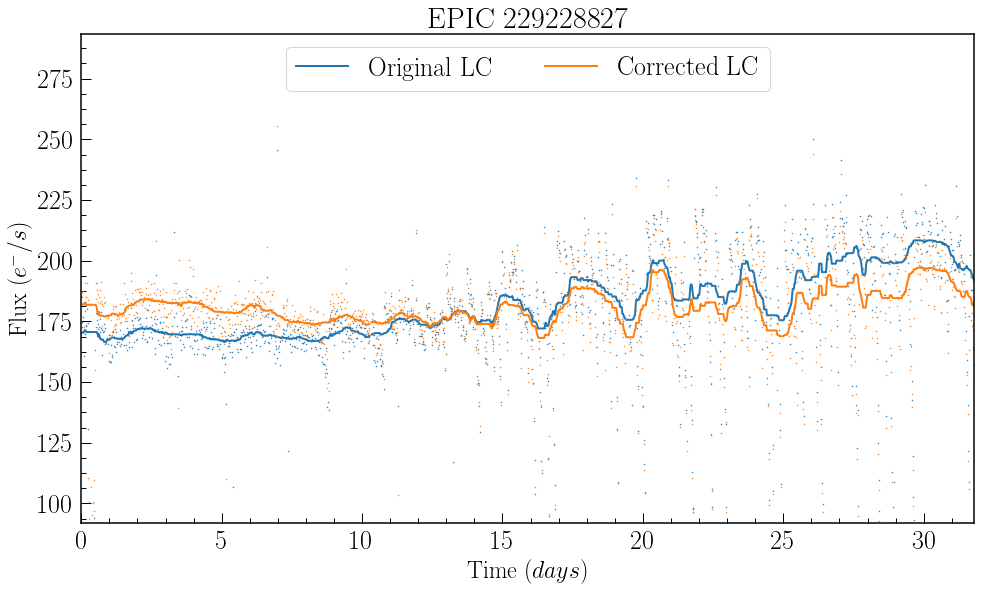

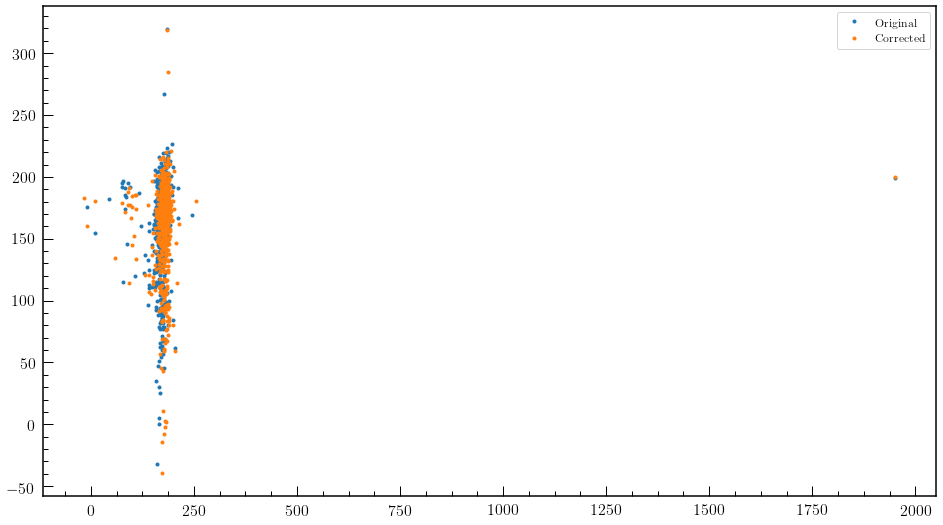

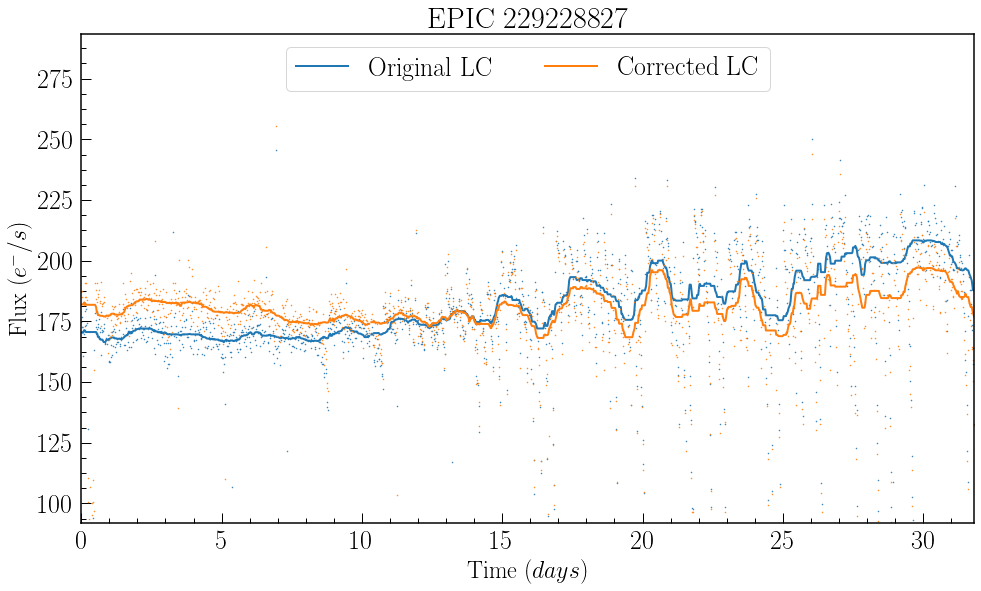

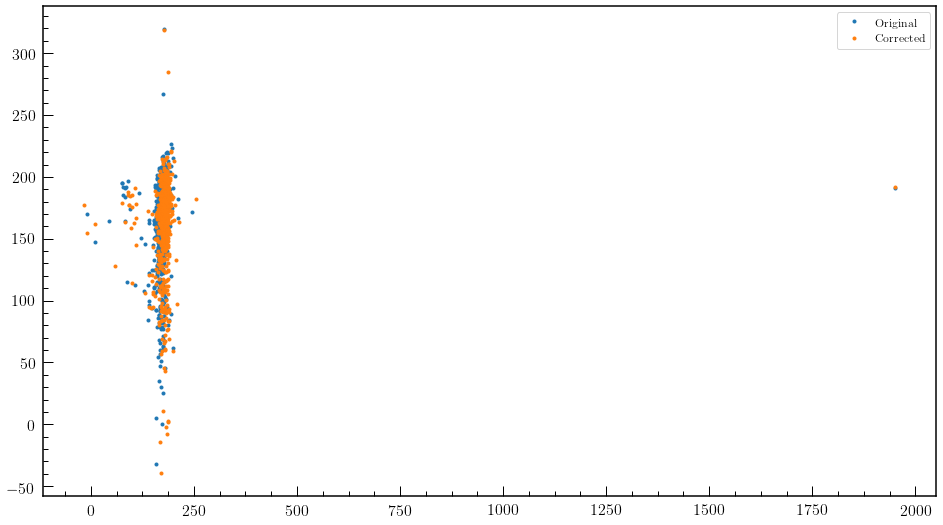

In [ ]:
print "Folding..."
def fold(x, step):
    
    x_ = np.nanmean(filter(lambda y: len(y)==step, [x[i:i+step:] for i in xrange(0,len(x), step)]), axis=0)
    return x_

def get_folds(x, step):
    
    x1, x2 = [x[i:i+step:] for i in xrange(0,len(x), step)]
    x1 = x1[:len(x2)]
    return x1, x2

folding = int(7.66*4*1/(t[1]-t[0]))
def make_plot(folding):
    ccd, EPIC = objs[1]
    fig, ax = subplots(1,1, figsize=(16,9))
    ax.set_title("EPIC %i" % EPIC, fontsize=30)
    ax.set_ylabel('Flux $(e^{-}/s)$', fontsize=24)
    ax.set_xlabel('Time $(days)$', fontsize=24)

    smoothing = 60
    #folding = 200
    #folding = int(1/0.388*1/(t[1]-t[0]))
    
    #folding = int(25.5*1/(t[1]-t[0]))
    print "Folding Over Interval %i" % folding
    t_ = t[:folding]-t[0]
    _cor_lc = cs[-1]
    new_lc = fs[-1]
    #_cor_lc = cor_lc-np.nanmedian(cor_lc)+np.nanmedian(new_lc)
    #print t_-t_[0]
    #for i in filter(lambda x: len(x) == folding, [_cor_lc[i:i+folding] for i in xrange(0,len(new_lc), folding)][:6]):
    #    plotNiceIntervals(ax, t_, i, N=smoothing)

    plotNiceIntervals(ax, t_, fold(new_lc[folding:], folding), label='Original LC', N=smoothing)

    #plotNiceIntervals(ax, t_, fold((lc_correction-np.nanmedian(lc_correction))+np.nanmedian(new_lc), folding), label='Correction (Offset)', N=smoothing)
    plotNiceIntervals(ax, t_, fold(_cor_lc[folding:], folding), label='Corrected LC', N=smoothing)


    #m = np.nanmedian(nearest_lc)
    #plotNiceIntervals(ax, t, nearest_lc, label='Correction', N=60)

    #ax.set_ylim(22000,23550)
    #ax.set_ylim(318000,321500)
    #ax.set_ylim(90500,91500)
    #ax.lines[-2].set_visible(False)
    #ax.lines[-4].set_visible(False)
    #ax.lines[-6].set_visible(False)
    #ax.lines[-8].set_visible(False)
    ax.legend(fontsize=26, ncol=3)

    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(26) 

    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(26) 

    ax.set_ylim(np.nanmean(new_lc)-np.nanstd(new_lc)*1.5,np.nanmean(new_lc)+np.nanstd(new_lc)*2.5)
    ax.set_xlim(t_[0], t_[-1])

    print fluxToMag(130)
    print fluxToMag(169)
    
    fig2, ax2 = subplots(1,1, figsize=(16,9))
    x1, x2 = get_folds(new_lc[folding:], folding)
    y1, y2 = get_folds(_cor_lc[folding:], folding)
    ax2.plot(x1, x2, marker='.', ls=' ', label='Original')
    ax2.plot(y1, y2, marker='.', ls=' ', label='Corrected')
    ax2.legend()
    
for add in xrange(30):
    folding = 1530+add
    make_plot(folding)


In [410]:
print fluxToMag(120)

19.9034200056
